# Fig. 6. Association of meta-analytic findings with neurotransmitter receptor/transporter maps

In [1]:
# set_env.py is not included in the repo
# it defines $HCP_DENSE_PATH, $PROJECT_DIR (required) and $HCP_DIR (optional)
# in environment variables
import set_env

In [4]:
import sys

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import neuromaps.transforms
import nilearn.plotting
import os
import statsmodels.stats.multitest
import surfplot

import pyvirtualdisplay
# create virtual display for plotting meshes in remote servers
disp=pyvirtualdisplay.Display(visible=False)
disp.start()


sys.path.append('../scripts')
from helpers import io, transform, plot, stats

sns.set_style('whitegrid')
plt.rcParams.update({"font.size": 12, "font.family": "Asana Math", "figure.dpi": 192})

## A. Receptor/transporter density PET maps

Load parcellated PET maps:

In [5]:
pet_data = io.load_pet_maps('400', 'S2')
selected_receptors = ['5HT1a', '5HT1b', '5HT2a', '5HT4', '5HT6', '5HTT', 'NAT', 'NMDA']
pet_data = pet_data.loc[:, selected_receptors]

Load cluster and transform it to fsLR:

In [6]:
# load cluster
cluster_nifti = os.path.join(io.RESULTS_DIR, 'ale', 'Contrast', 
                             'Results', 'MainEffect', 'Full', 'Volumes', 'Corrected',
                             'Contrast_increased_cFWE05.nii')
# map to fsLR
cluster_fslr = neuromaps.transforms.mni152_to_fslr(cluster_nifti, method='nearest')
cluster_fslr = np.concatenate([cluster_fslr[0].agg_data(), cluster_fslr[1].agg_data()])
# create mask
cluster_mask = cluster_fslr > 0

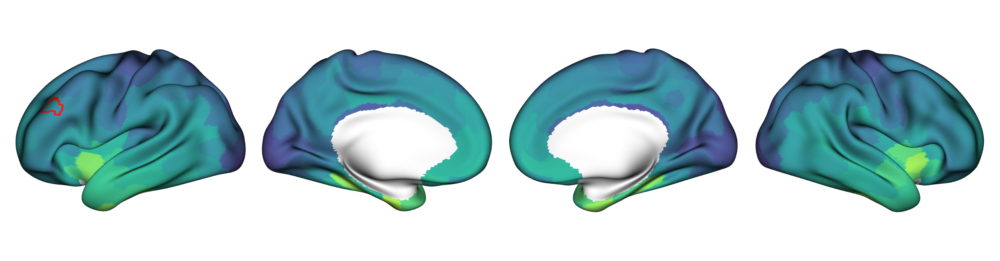

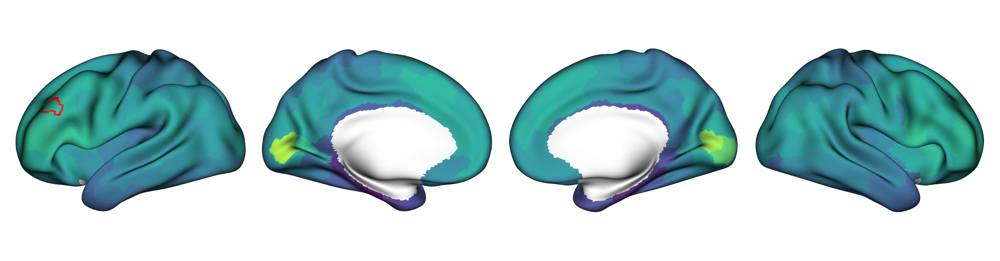

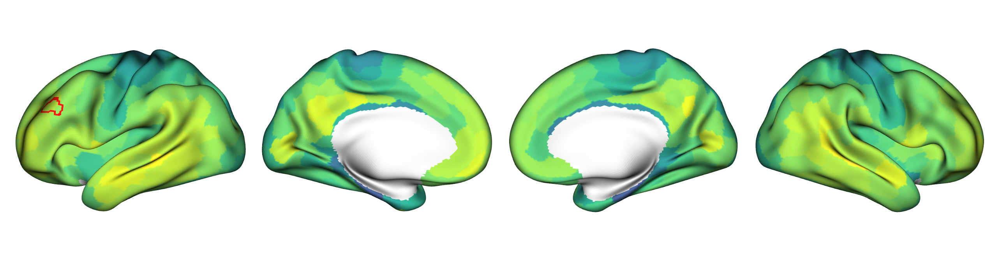

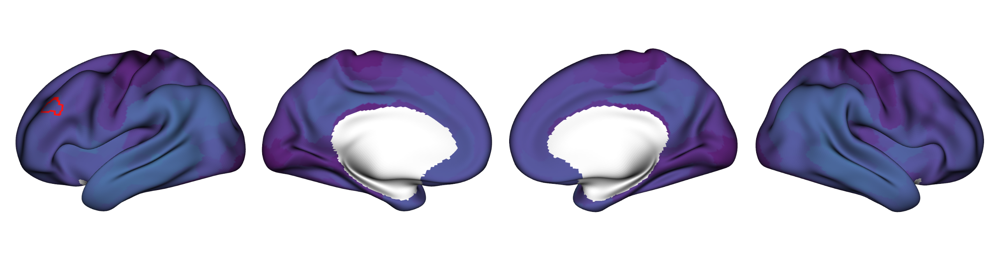

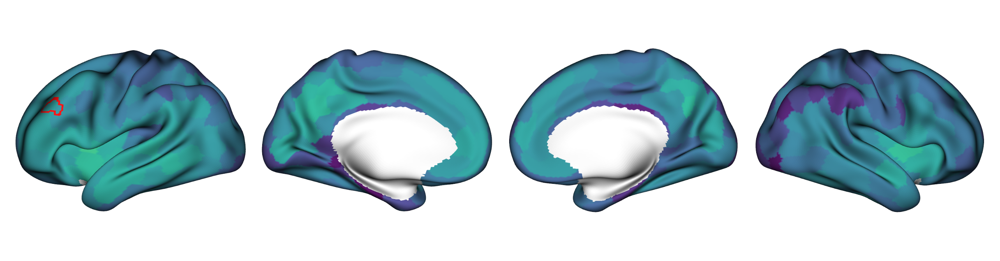

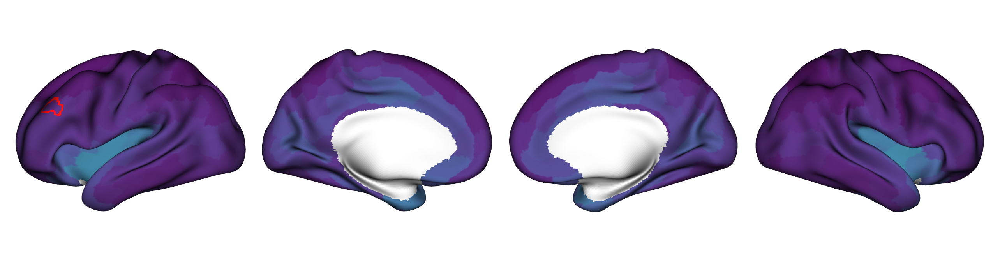

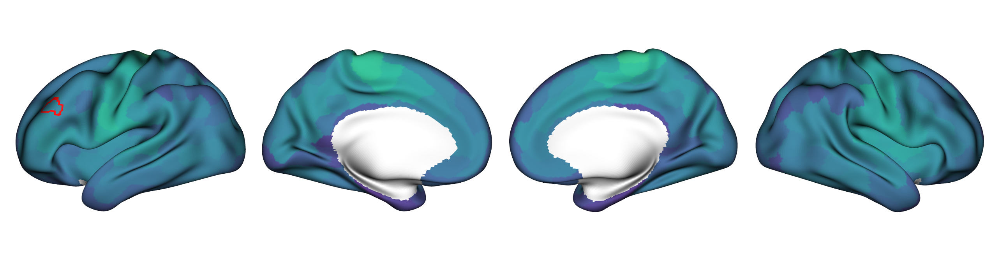

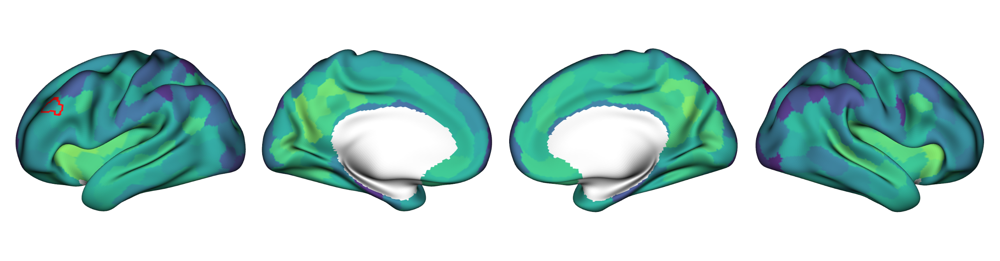

In [7]:
plots = []
for receptor in selected_receptors:
    # deparcellate to cifti and transform to fslr
    receptor_cifti = transform.parc_to_cifti(pet_data.loc[:, receptor], '400', 'S2').T
    receptor_fslr = transform.cifti_to_fsLR(receptor_cifti)
    # set the color range to a whole-brain range also considering subcortex
    color_range = (np.nanmin(pet_data.loc[:, receptor]), np.nanmax(pet_data.loc[:, receptor]))
    # plot brain background
    p = surfplot.Plot(surf_lh=plot.MESHES_FSLR['L'], surf_rh=plot.MESHES_FSLR['R'], 
                 layout='row', size = (1600, 400), zoom = 1.2, brightness=0.8, mirror_views=True)
    # plot receptor map
    p.add_layer(receptor_fslr, cmap='viridis', cbar=False, color_range=color_range)
    # plot cluster extended mask outline
    p.add_layer(cluster_mask, cmap='red_transparent', as_outline=True, cbar=False)
    p.build()
    plots.append(p)

/data/group/cng/Projects/Amin/antidepressants_ale/public/scripts/figures/../helpers/plot.py:172: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Right Hippocampus' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  tian_to_mesh.loc[label] = f'{hem} {abbr_to_full[key]}'
/data/group/cng/Projects/Amin/antidepressants_ale/venv/lib/python3.11/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


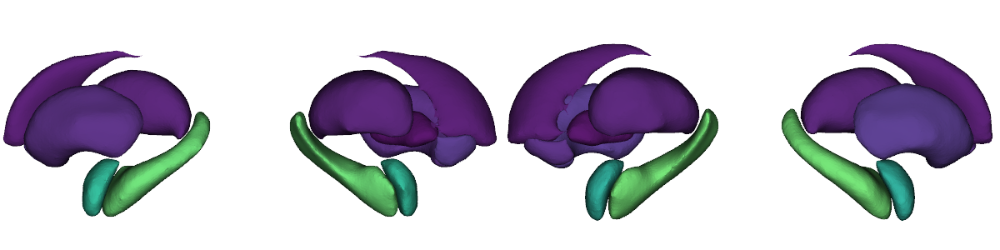

/data/group/cng/Projects/Amin/antidepressants_ale/public/scripts/figures/../helpers/plot.py:172: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Right Hippocampus' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  tian_to_mesh.loc[label] = f'{hem} {abbr_to_full[key]}'
/data/group/cng/Projects/Amin/antidepressants_ale/venv/lib/python3.11/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


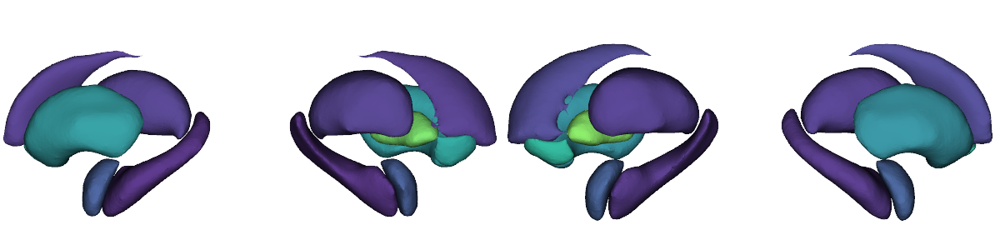

/data/group/cng/Projects/Amin/antidepressants_ale/public/scripts/figures/../helpers/plot.py:172: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Right Hippocampus' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  tian_to_mesh.loc[label] = f'{hem} {abbr_to_full[key]}'
/data/group/cng/Projects/Amin/antidepressants_ale/venv/lib/python3.11/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


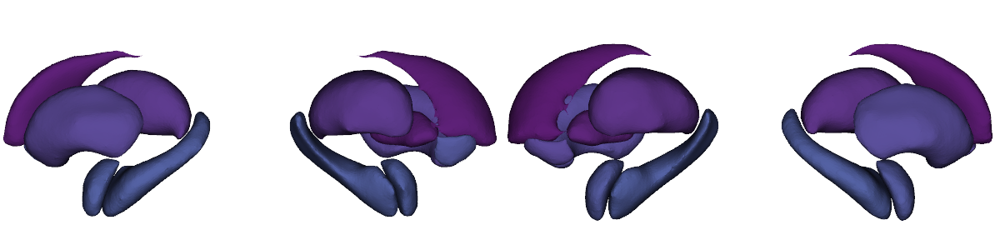

/data/group/cng/Projects/Amin/antidepressants_ale/public/scripts/figures/../helpers/plot.py:172: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Right Hippocampus' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  tian_to_mesh.loc[label] = f'{hem} {abbr_to_full[key]}'
/data/group/cng/Projects/Amin/antidepressants_ale/venv/lib/python3.11/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


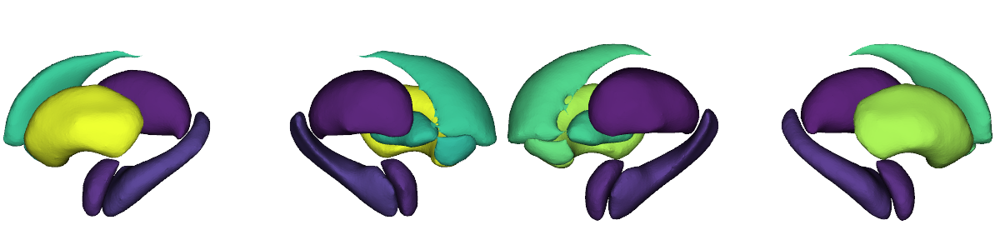

/data/group/cng/Projects/Amin/antidepressants_ale/public/scripts/figures/../helpers/plot.py:172: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Right Hippocampus' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  tian_to_mesh.loc[label] = f'{hem} {abbr_to_full[key]}'
/data/group/cng/Projects/Amin/antidepressants_ale/venv/lib/python3.11/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


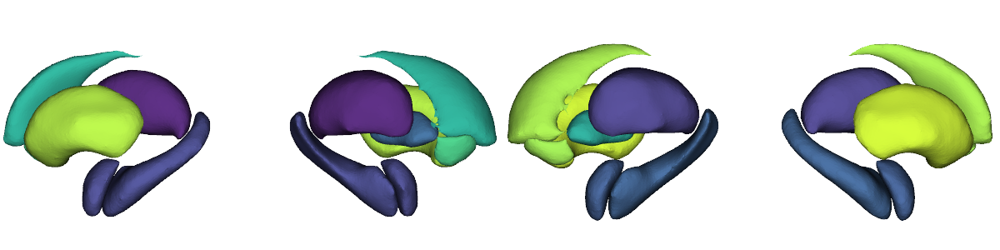

/data/group/cng/Projects/Amin/antidepressants_ale/public/scripts/figures/../helpers/plot.py:172: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Right Hippocampus' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  tian_to_mesh.loc[label] = f'{hem} {abbr_to_full[key]}'
/data/group/cng/Projects/Amin/antidepressants_ale/venv/lib/python3.11/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


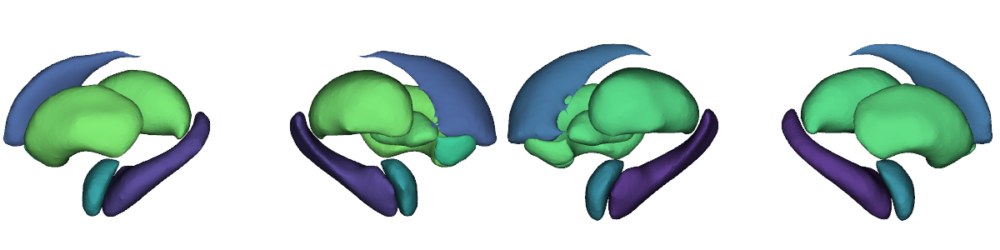

/data/group/cng/Projects/Amin/antidepressants_ale/public/scripts/figures/../helpers/plot.py:172: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Right Hippocampus' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  tian_to_mesh.loc[label] = f'{hem} {abbr_to_full[key]}'
/data/group/cng/Projects/Amin/antidepressants_ale/venv/lib/python3.11/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


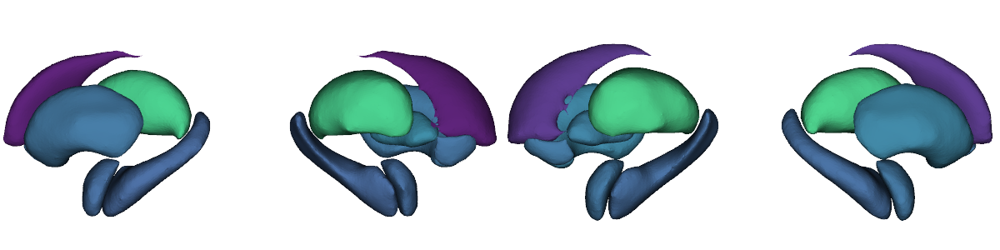

/data/group/cng/Projects/Amin/antidepressants_ale/public/scripts/figures/../helpers/plot.py:172: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Right Hippocampus' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  tian_to_mesh.loc[label] = f'{hem} {abbr_to_full[key]}'
/data/group/cng/Projects/Amin/antidepressants_ale/venv/lib/python3.11/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


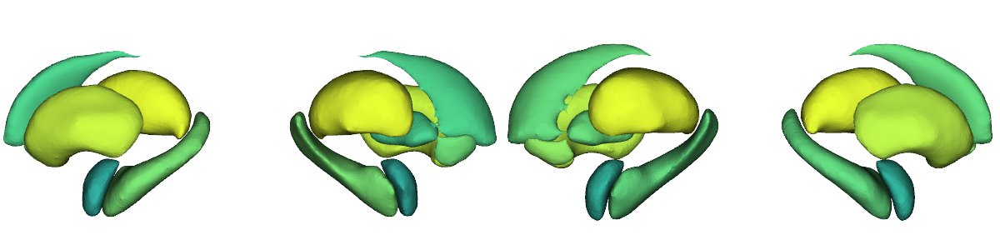

In [8]:
for receptor in selected_receptors:
    display(plot.plot_parc_subcortical(pet_data.loc[:, receptor], cmap='viridis', zoom=1.4, color_range='whole-brain'))

## B. Receptor/transporter density in L DLPFC

Create surrogates:

In [9]:
surrogates, parcels = stats.get_variogram_surrogates(
    pet_data,
    '400', 'S2',
    n_perm=1000,
    surrogates_path='./pet_selected_schaefer-400_tian-S2_n-1000_variograms.npz'
)

Surrogates already exist in ./pet_selected_schaefer-400_tian-S2_n-1000_variograms.npz


Reorder PET data parcels to match variogram-based surrogates:

In [10]:
pet_data = pet_data.loc[parcels]

In [11]:
obs_median = pd.Series(index=selected_receptors)
p = pd.Series(index=selected_receptors)

for i, receptor in enumerate(selected_receptors):
    print(receptor)
    receptor_parc = pet_data.loc[:, receptor].copy()
    receptor_surrogates = pd.DataFrame(surrogates[:, :, i].T.copy(), index=receptor_parc.index)
    receptor_surrogates_parc = pd.concat([receptor_parc, receptor_surrogates], axis=1)
    # normalize receptor data and surrogates to 0-1
    receptor_surrogates_parc = (receptor_surrogates_parc - receptor_surrogates_parc.min()) \
        / (receptor_surrogates_parc.max() - receptor_surrogates_parc.min())
    # deparcellate to cifti and then transform to fsLR
    receptor_surrogates_cifti = transform.parc_to_cifti(receptor_surrogates_parc, '400', 'S2').T
    receptor_surrogates_fslr = transform.cifti_to_fsLR(receptor_surrogates_cifti)
    receptor_surrogates_median_cluster = np.median(receptor_surrogates_fslr[:, cluster_mask], axis=1)
    obs_median.loc[receptor] = receptor_surrogates_median_cluster[0]
    p.loc[receptor] = ((np.abs(receptor_surrogates_median_cluster[1:]) >= np.abs(receptor_surrogates_median_cluster[0])).sum() + 1) / 1001

# FDR correction
_, p_fdr = statsmodels.stats.multitest.fdrcorrection(p)
p_fdr = pd.Series(p_fdr, index=selected_receptors)

results = pd.DataFrame({'median': obs_median, 'p': p, 'p_fdr': p_fdr})
results

5HT1a
5HT1b
5HT2a
5HT4
5HT6
5HTT
NAT
NMDA


,median,p,p_fdr
5HT1a,0.450945,0.575425,0.895105
5HT1b,0.587157,0.367632,0.895105
5HT2a,0.873368,0.033966,0.271728
5HT4,0.196198,0.915085,0.980020
5HT6,0.488873,0.486513,0.895105
5HTT,0.073713,0.980020,0.980020
NAT,0.407537,0.671329,0.895105
NMDA,0.459469,0.580420,0.895105


Text(0.5, 0, 'Normalized receptor density in L DLPFC')

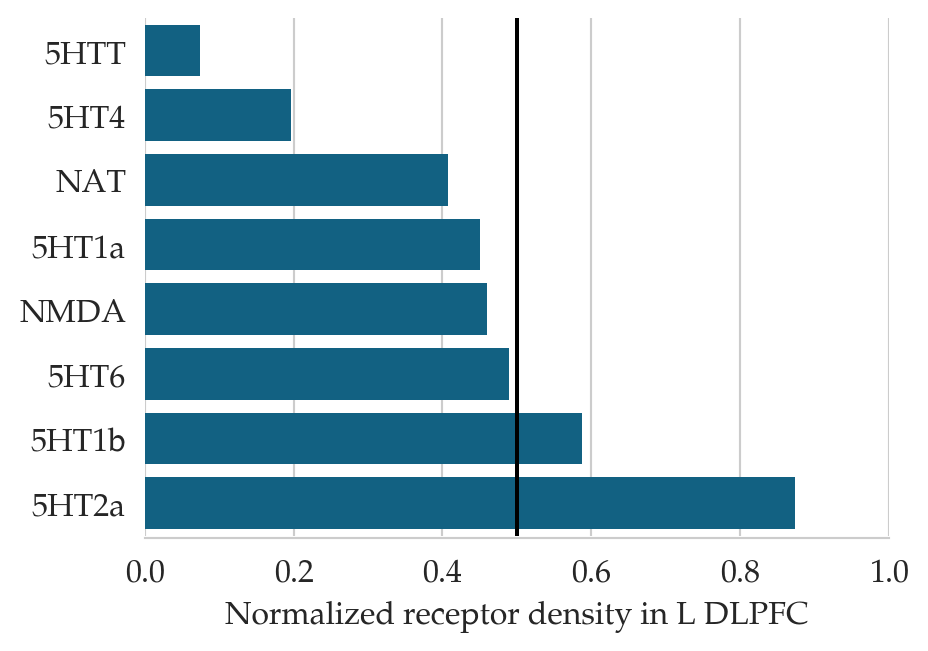

In [12]:
fig, ax = plt.subplots(1, figsize=(5, 3.5))
sns.barplot(
    data=results.reset_index().sort_values('median'), 
    y='index', x='median',
    color='#006994',
    linewidth=0, ax=ax)
sns.despine(offset=1, left=True, trim=False, ax=ax)
ax.axvline(0.5, color='black')
ax.set_xlim((0, 1))
# ax.axvline(0, color='black')
# ax.set_xlim((-0.5, 0.5))
ax.set_ylabel('')
ax.set_xlabel('Normalized receptor density in L DLPFC')

Plot cluster extent as outline:

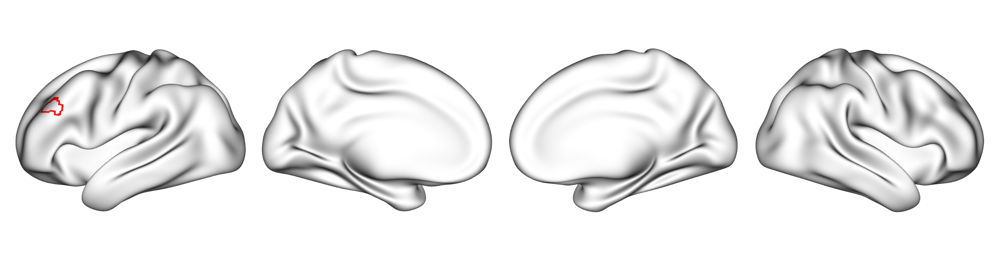

In [13]:
# plot brain background
p = surfplot.Plot(surf_lh=plot.MESHES_FSLR['L'], surf_rh=plot.MESHES_FSLR['R'], 
             layout='row', size = (1600, 400), zoom = 1.2, brightness=0.8, mirror_views=True)
# plot cluster extended mask outline
p.add_layer(cluster_mask, cmap='red_transparent', as_outline=True, cbar=False)
p.build();

# c. Correlation with the convergent connectivity map

In [14]:
# load and parcellate the ccm
ccm = np.load(os.path.join(io.RESULTS_DIR, 'ccm', 'ccm_random_weighted_n-1000', 'All', 'zmap.npy'))
# parcellate cortex to Schaefer-400 and subcortex to Tian-S2
ccm_parc = transform.parcellate_cifti(ccm, schaefer='400', tian='S2')
ccm_parc.columns = ['CCM']
# calculate correlation of the maps while correcting for SA using variograms
coefs, pvals, null_distribution = stats.variogram_test(
    ccm_parc, 
    pet_data.loc[ccm_parc.index], # must be aligned 
    n_perm=1000, 
    surrogates_path='./ccm_all_schaefer-400_tian-S2_n-1000_variograms.npz'
)

# FDR correction
_, pvals_fdr = statsmodels.stats.multitest.fdrcorrection(pvals.values.flatten())
pvals_fdr = pd.DataFrame(pvals_fdr.reshape(pvals.shape), index=pvals.index, columns=pvals.columns)

Surrogates already exist in ./ccm_all_schaefer-400_tian-S2_n-1000_variograms.npz


In [15]:
coefs

,5HT1a,5HT1b,5HT2a,5HT4,5HT6,5HTT,NAT,NMDA
CCM,-0.018445,0.102102,0.024969,-0.037158,0.077993,0.125456,0.013903,0.137141


In [16]:
pvals_fdr

,5HT1a,5HT1b,5HT2a,5HT4,5HT6,5HTT,NAT,NMDA
CCM,0.905095,0.905095,0.905095,0.905095,0.905095,0.905095,0.905095,0.905095


In [17]:
pvals_fdr < 0.05

,5HT1a,5HT1b,5HT2a,5HT4,5HT6,5HTT,NAT,NMDA
CCM,False,False,False,False,False,False,False,False


Text(0.5, 0, 'Correlation coefficient')

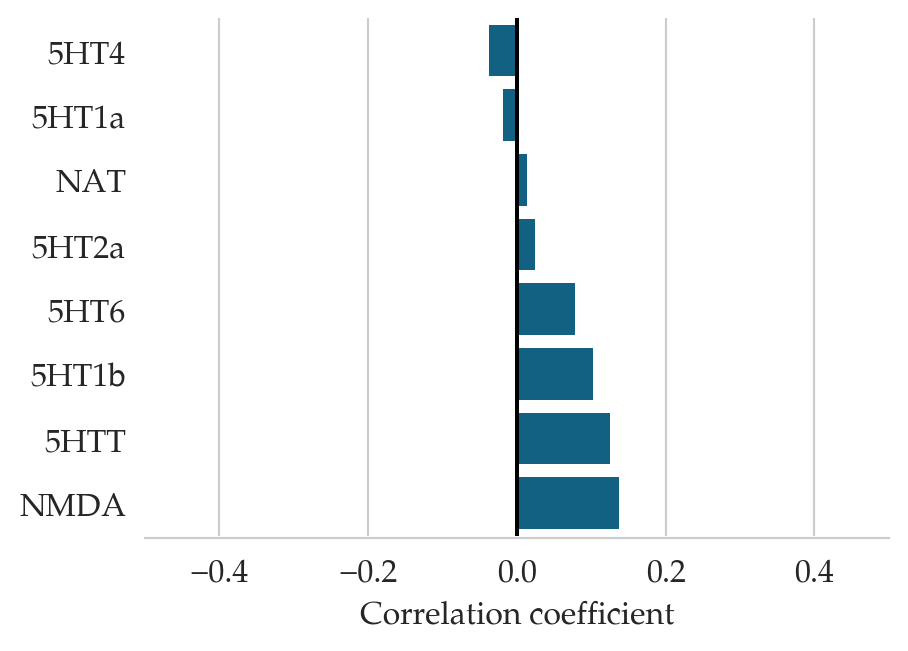

In [18]:
fig, ax = plt.subplots(1, figsize=(5, 3.5))
sns.barplot(
    data=coefs.T.reset_index().sort_values('CCM'), 
    y='index', x='CCM',
    color='#006994',
    linewidth=0, ax=ax)
sns.despine(offset=1, left=True, trim=False, ax=ax)
ax.axvline(0, color='black')
ax.set_xlim((-0.5, 0.5))
# ax.axvline(0, color='black')
# ax.set_xlim((-0.5, 0.5))
ax.set_ylabel('')
ax.set_xlabel(f'Correlation coefficient')